In [ ]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
!tar -xf VOCtrainval_06-Nov-2007.tar
!pip install clip
!conda install --yes -c pytorch pytorch=1.7.1 torchvision cudatoolkit=11.0
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

--2025-02-06 08:53:48--  http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 460032000 (439M) [application/x-tar]
Saving to: ‘VOCtrainval_06-Nov-2007.tar’

VOCtrainval_06-Nov- 100%[===================>] 438.72M  18.1MB/s    in 24s     

2025-02-06 08:54:12 (18.6 MB/s) - ‘VOCtrainval_06-Nov-2007.tar’ saved [460032000/460032000]



# Imports

In [ ]:
import os
import glob
import clip
import torch
import tarfile
import imageio
import numpy as np
import pandas as pd
from PIL import Image
import torch.nn as nn
import seaborn as sns
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import xml.etree.ElementTree as ET
from torchvision import transforms, models
import torchvision.transforms as transforms
from torchvision.datasets import VOCDetection
from IPython.display import display, Image as IPImage
from torch.utils.data import random_split, Dataset, DataLoader, Subset


# Example of images

find iamags: 5011
['/content/VOCdevkit/VOC2007/JPEGImages/000626.jpg', '/content/VOCdevkit/VOC2007/JPEGImages/001517.jpg', '/content/VOCdevkit/VOC2007/JPEGImages/006264.jpg', '/content/VOCdevkit/VOC2007/JPEGImages/005310.jpg', '/content/VOCdevkit/VOC2007/JPEGImages/009281.jpg']


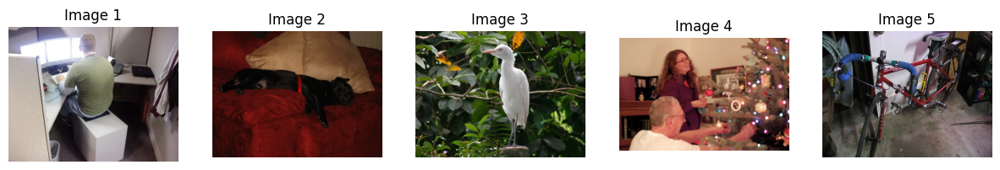

In [ ]:
image_dir = "/content/VOCdevkit/VOC2007/JPEGImages"
image_paths = glob.glob(os.path.join(image_dir, "*.jpg"))
fig, axes = plt.subplots(1, 5, figsize=(15, 5))

print(f"find iamags: {len(image_paths)}" )
print(image_paths[:5])
for i in range(5):
    img = Image.open(image_paths[i])
    axes[i].imshow(img)
    axes[i].axis("off")
    axes[i].set_title(f"Image {i+1}")
plt.show()


# Organize in data frame

In [ ]:
# Path to the Annotations, JPEGImages, SegmentationClass, and SegmentationObject directories
annotations_path = "/content/VOCdevkit/VOC2007/Annotations"
images_path = "/content/VOCdevkit/VOC2007/JPEGImages"
segmentation_class_path = "/content/VOCdevkit/VOC2007/SegmentationClass"
segmentation_object_path = "/content/VOCdevkit/VOC2007/SegmentationObject"

# Function to parse each XML file and extract relevant data
def parse_xml(file_path):
    tree = ET.parse(file_path)
    root = tree.getroot()

    data = {}
    data['filename'] = root.find('filename').text
    data['object_name'] = root.find('object').find('name').text
    data['xmin'] = root.find('object').find('bndbox').find('xmin').text
    data['ymin'] = root.find('object').find('bndbox').find('ymin').text
    data['xmax'] = root.find('object').find('bndbox').find('xmax').text
    data['ymax'] = root.find('object').find('bndbox').find('ymax').text
    data['image_path'] = os.path.join(images_path, data['filename'])  # Link to image
    data['segmentation_class_path'] = os.path.join(segmentation_class_path, data['filename'].replace('.jpg', '.png'))  # Link to class segmentation mask
    data['segmentation_object_path'] = os.path.join(segmentation_object_path, data['filename'].replace('.jpg', '.png'))  # Link to object segmentation mask
    return data

# List all XML files in the annotations directory
xml_files = [f for f in os.listdir(annotations_path) if f.endswith('.xml')]

# Parse each XML file and load the data into a list
data = []
for xml_file in xml_files:
    file_path = os.path.join(annotations_path, xml_file)
    data.append(parse_xml(file_path))

# Create a DataFrame from the data
df = pd.DataFrame(data)

# Example

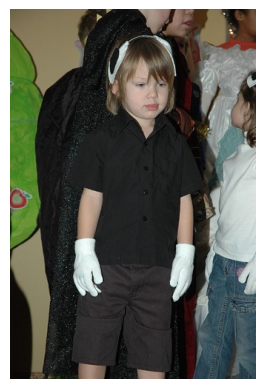

In [ ]:
# Get the path of the first image from the DataFrame
image_path = df.loc[0, 'image_path']
image_path
# # Read the image using matplotlib
img = mpimg.imread(image_path)

# # Display the image
plt.imshow(img)
plt.axis('off')
plt.show()

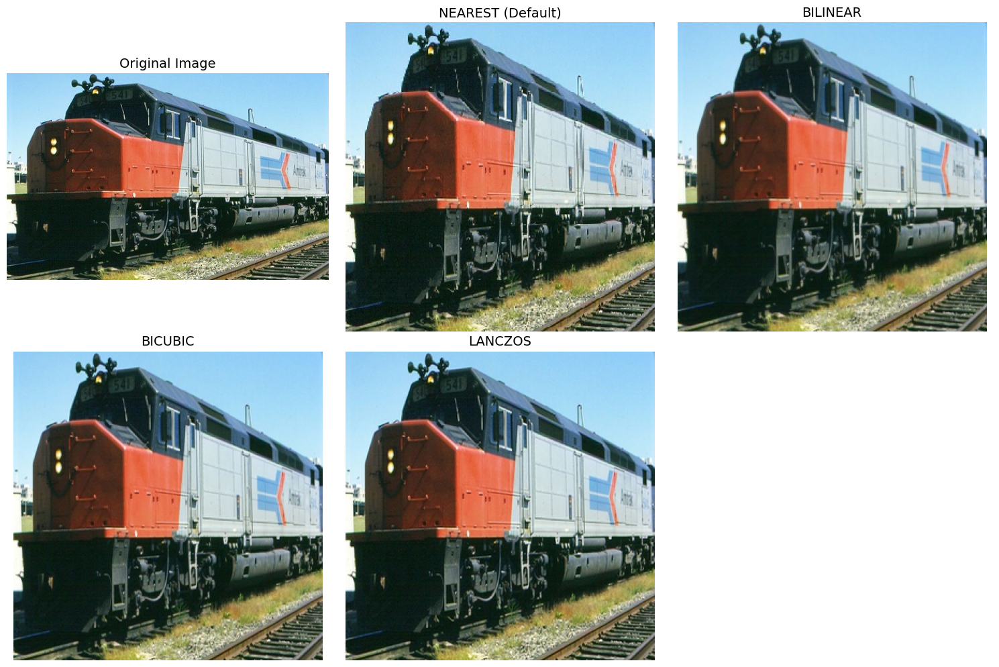

In [ ]:
image = Image.open("/content/VOCdevkit/VOC2007/JPEGImages/008295.jpg")

resized_default = image.resize((288, 288))

resized_bicubic = image.resize((288, 288), Image.BICUBIC)
resized_NEAREST = image.resize((288, 288), Image.NEAREST)
resized_BILINEAR = image.resize((288, 288), Image.BILINEAR)
resized_BICUBIC = image.resize((288, 288), Image.BICUBIC)

resized_LANCZOS = image.resize((288, 288), Image.LANCZOS)

images = [
    ("Original Image", image),
    ("NEAREST (Default)", resized_NEAREST),
    ("BILINEAR", resized_BILINEAR),
    ("BICUBIC", resized_BICUBIC),
    ("LANCZOS", resized_LANCZOS),
]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

axes = axes.flatten()

for i, (title, img) in enumerate(images):
    axes[i].imshow(img)
    axes[i].set_title(title, fontsize=14)
    axes[i].axis("off")

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

# Step 1

In [ ]:
class SuperResDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        # List all image files in the dataset
        self.image_dir = os.path.join(root_dir, 'VOC2007', 'JPEGImages')
        self.image_files = [f for f in os.listdir(self.image_dir) if f.endswith('.jpg')]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_name = self.image_files[idx]
        image_path = os.path.join(self.image_dir, image_name)

        image = Image.open(image_path).convert("RGB")

        image_x = image.resize((72, 72), Image.BICUBIC)
        image_y_mid = image.resize((144, 144), Image.BICUBIC)
        image_y_large = image.resize((288, 288), Image.BICUBIC)


        image_x = np.array(image_x, dtype=np.float32) / 255.0
        image_y_mid = np.array(image_y_mid, dtype=np.float32) / 255.0
        image_y_large = np.array(image_y_large, dtype=np.float32) / 255.0

        image_x = torch.tensor(image_x).permute(2, 0, 1)
        image_y_mid = torch.tensor(image_y_mid).permute(2, 0, 1)
        image_y_large = torch.tensor(image_y_large).permute(2, 0, 1)

        sample = {'X': image_x, 'y_mid': image_y_mid, 'y_large': image_y_large}

        if self.transform:
            sample = self.transform(sample)

        return sample


In [ ]:
dataset = SuperResDataset(root_dir='/content/VOCdevkit')
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# Fetch a sample
sample = dataset[0]
print(sample['X'].shape, sample['y_mid'].shape, sample['y_large'].shape)

torch.Size([3, 72, 72]) torch.Size([3, 144, 144]) torch.Size([3, 288, 288])


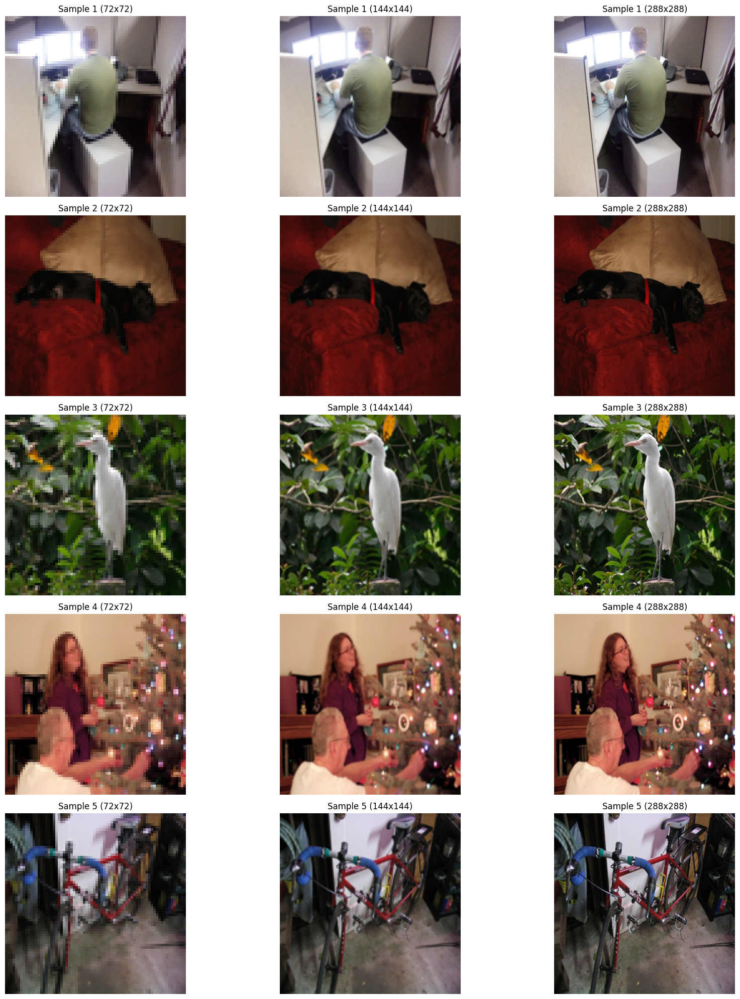

In [ ]:
# Set up the figure for plotting 5 samples, each having 3 images
fig, axes = plt.subplots(5, 3, figsize=(18, 20))

# Loop through the first 5 samples in the dataset
for i in range(5):
    sample = dataset[i]

    # Extract the three images: X, y_mid, y_large
    image_x = sample['X'].permute(1, 2, 0).numpy()  # Convert from CxHxW to HxWxC
    image_y_mid = sample['y_mid'].permute(1, 2, 0).numpy()
    image_y_large = sample['y_large'].permute(1, 2, 0).numpy()

    # Plot the images for the current sample
    axes[i, 0].imshow(image_x)
    axes[i, 0].set_title(f'Sample {i + 1} (72x72)')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(image_y_mid)
    axes[i, 1].set_title(f'Sample {i + 1} (144x144)')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(image_y_large)
    axes[i, 2].set_title(f'Sample {i + 1} (288x288)')
    axes[i, 2].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [ ]:
# Shuffle the dataset first
dataset_size = len(dataset)
indices = torch.randperm(dataset_size).tolist()

# Split the indices: 1000 images for validation, the rest for training
val_size = 1000
train_size = dataset_size - val_size

# Split the dataset into training and validation sets
train_indices, val_indices = indices[val_size:], indices[:val_size]

# Create the training and validation datasets using the indices
train_dataset = torch.utils.data.Subset(dataset, train_indices)
val_dataset = torch.utils.data.Subset(dataset, val_indices)

# Create DataLoader for both training and validation sets
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# Example: Print the number of batches in the train and validation sets
print(f"Number of batches in training set: {len(train_loader)}")
print(f"Number of batches in validation set: {len(val_loader)}")


Number of batches in training set: 1003
Number of batches in validation set: 250


# A small sample to test the pipeline

In [ ]:
dataset_size = len(dataset)
small_dataset_size = min(60, dataset_size)

indices = torch.randperm(dataset_size).tolist()

train_size = int(0.8 * small_dataset_size)
val_size = small_dataset_size - train_size

train_indices, val_indices = indices[:train_size], indices[train_size:small_dataset_size]

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

print(f"Total dataset size used: {small_dataset_size}")
print(f"Training set size: {len(train_dataset)} images")
print(f"Validation set size: {len(val_dataset)} images")
print(f"Number of batches in training set: {len(train_loader)}")
print(f"Number of batches in validation set: {len(val_loader)}")


Total dataset size used: 60
Training set size: 48 images
Validation set size: 12 images
Number of batches in training set: 12
Number of batches in validation set: 3


# Step 2

# PSNR loss function

In [ ]:
class PSNRLoss(nn.Module):
    def __init__(self, max_pixel_value=1.0):
        super(PSNRLoss, self).__init__()
        self.max_pixel_value = max_pixel_value

    def forward(self, output, target):
        mse = F.mse_loss(output, target)
        psnr = 20 * torch.log10(self.max_pixel_value / torch.sqrt(mse + 1e-8))
        return 1 / psnr


# First model

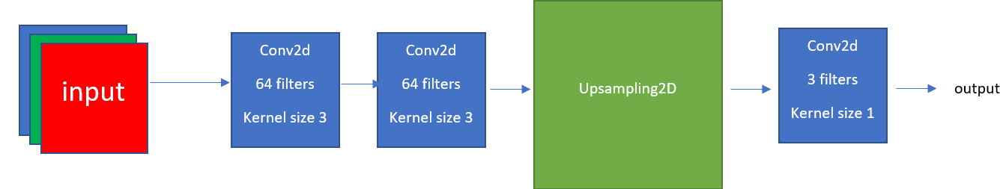

In [ ]:
class SuperResNet(nn.Module):
    def __init__(self):
        super(SuperResNet, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = self.upsample(x)
        x = self.conv3(x)
        x = torch.sigmoid(x)
        return x


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = SuperResNet().to(device)

criterion = PSNRLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_history = []


for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for inputs in train_loader:
        X = inputs['X'].to(device)
        y_mid = inputs['y_mid'].to(device)

        optimizer.zero_grad()
        outputs = model(X)
        loss = criterion(outputs, y_mid)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    avg_loss = running_loss / len(train_loader)
    loss_history.append(avg_loss)
    print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {avg_loss:.4f}')


Using device: cuda
Epoch [1/10], Loss: 0.0405
Epoch [2/10], Loss: 0.0375
Epoch [3/10], Loss: 0.0369
Epoch [4/10], Loss: 0.0367
Epoch [5/10], Loss: 0.0365
Epoch [6/10], Loss: 0.0364
Epoch [7/10], Loss: 0.0363
Epoch [8/10], Loss: 0.0361
Epoch [9/10], Loss: 0.0361
Epoch [10/10], Loss: 0.0361


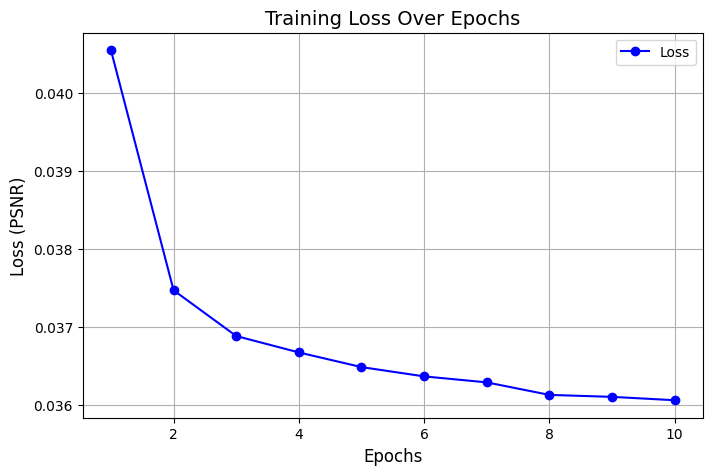

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

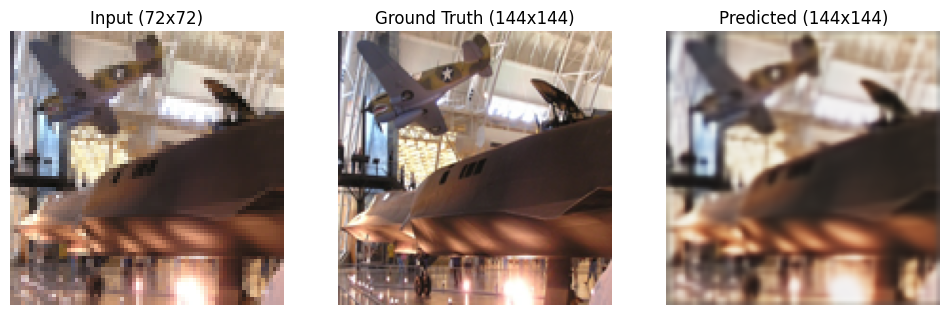

In [ ]:
model.eval()

with torch.no_grad():
    for inputs in val_loader :
        X = inputs['X'].to(device)
        y_mid = inputs['y_mid'].to(device)
        y_pred = model(X)

        X = X[0].cpu().permute(1, 2, 0)
        y_mid = y_mid[0].cpu().permute(1, 2, 0)
        y_pred = y_pred[0].cpu().permute(1, 2, 0)

        fig, axes = plt.subplots(1, 3, figsize=(12, 4))

        axes[0].imshow(X.numpy())
        axes[0].set_title("Input (72x72)")
        axes[0].axis("off")

        axes[1].imshow(y_mid.numpy())
        axes[1].set_title("Ground Truth (144x144)")
        axes[1].axis("off")

        axes[2].imshow(y_pred.numpy())
        axes[2].set_title("Predicted (144x144)")
        axes[2].axis("off")

        plt.show()
        break


# Step 3

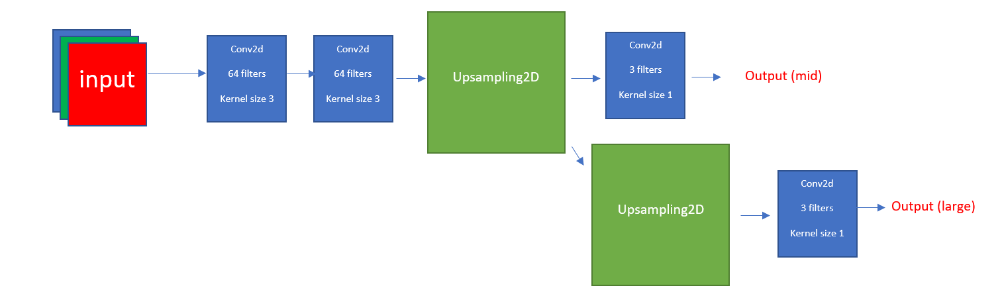

# Second model

In [ ]:
class SuperResNetMulti(nn.Module):
    def __init__(self):
        super(SuperResNetMulti, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)

        self.upsample_mid = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_mid = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

        self.upsample_large = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_large = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))

        x_mid = self.upsample_mid(x)
        out_mid = self.conv_mid(x_mid)

        x_large = self.upsample_large(x_mid)
        out_large = self.conv_large(x_large)
        out_mid = torch.sigmoid(out_mid)
        out_large = torch.sigmoid(out_large)
        return out_mid, out_large


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SuperResNetMulti().to(device)

criterion = PSNRLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_mid_history = []
loss_large_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")


Epoch [1/10], Mid Loss: 0.0421, Large Loss: 0.0460
Epoch [2/10], Mid Loss: 0.0385, Large Loss: 0.0431
Epoch [3/10], Mid Loss: 0.0379, Large Loss: 0.0426
Epoch [4/10], Mid Loss: 0.0375, Large Loss: 0.0423
Epoch [5/10], Mid Loss: 0.0373, Large Loss: 0.0422
Epoch [6/10], Mid Loss: 0.0371, Large Loss: 0.0420
Epoch [7/10], Mid Loss: 0.0370, Large Loss: 0.0420
Epoch [8/10], Mid Loss: 0.0369, Large Loss: 0.0418
Epoch [9/10], Mid Loss: 0.0367, Large Loss: 0.0417
Epoch [10/10], Mid Loss: 0.0366, Large Loss: 0.0417


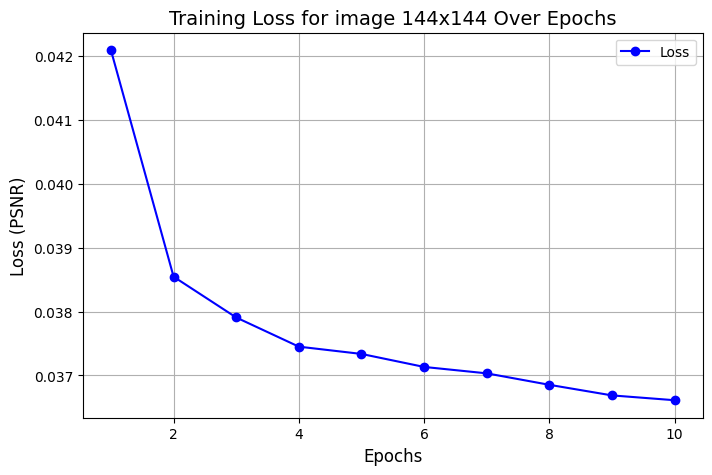

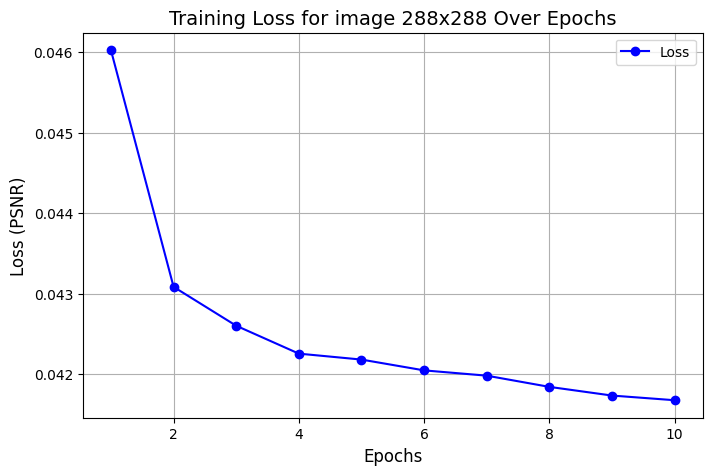

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_mid_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 144x144 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_large_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 288x288 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

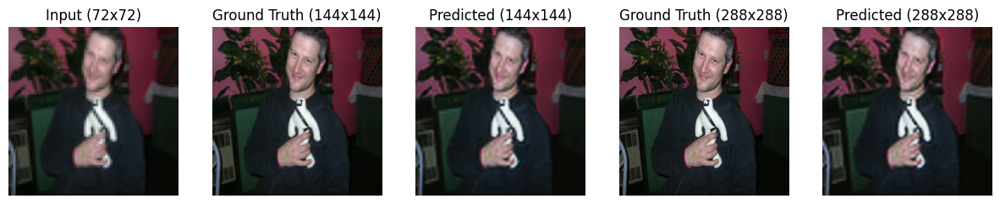

In [ ]:
model.eval()
with torch.no_grad():
    for inputs in val_loader:
        X = inputs['X'].to(device)
        y_mid = inputs['y_mid'].to(device)
        y_large = inputs['y_large'].to(device)

        out_mid, out_large = model(X)

        X = X[0].cpu().permute(1, 2, 0)
        y_mid = y_mid[0].cpu().permute(1, 2, 0)
        y_large = y_large[0].cpu().permute(1, 2, 0)
        out_mid = out_mid[0].cpu().permute(1, 2, 0)
        out_large = out_large[0].cpu().permute(1, 2, 0)

        fig, axes = plt.subplots(1, 5, figsize=(15, 5))

        axes[0].imshow(X.numpy())
        axes[0].set_title("Input (72x72)")
        axes[0].axis("off")

        axes[1].imshow(y_mid.numpy())
        axes[1].set_title("Ground Truth (144x144)")
        axes[1].axis("off")

        axes[2].imshow(out_mid.numpy())
        axes[2].set_title("Predicted (144x144)")
        axes[2].axis("off")

        axes[3].imshow(y_large.numpy())
        axes[3].set_title("Ground Truth (288x288)")
        axes[3].axis("off")

        axes[4].imshow(out_large.numpy())
        axes[4].set_title("Predicted (288x288)")
        axes[4].axis("off")

        plt.show()
        break



# Step 4

#Residual Block

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, channels=32):
        super(ResidualBlock, self).__init__()

        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.conv2(out)

        out += residual
        out = self.relu(out)
        return out


# Third model

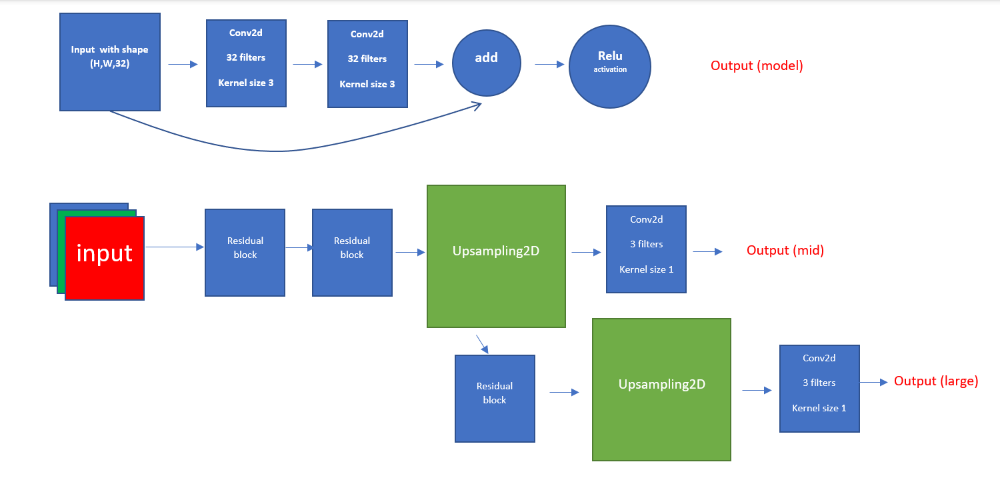

In [ ]:
class SuperResNetResidualBlock(nn.Module):
    def __init__(self):
        super(SuperResNetResidualBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)

        self.res1 = ResidualBlock(32)
        self.res2 = ResidualBlock(32)

        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_mid = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=1)

        self.res3 = ResidualBlock(32)

        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_large = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=1)

    def forward(self, x):
        x = torch.relu(self.conv1(x))

        x = self.res1(x)
        x = self.res2(x)

        x_mid = self.upsample1(x)
        out_mid = self.conv_mid(x_mid)

        x_large = self.res3(x_mid)

        x_large = self.upsample2(x_large)
        out_large = self.conv_large(x_large)

        return out_mid, out_large


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = SuperResNetResidualBlock().to(device)

criterion = PSNRLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_mid_history = []
loss_large_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")

Using device: cuda
Epoch [1/10], Mid Loss: 0.0399, Large Loss: 0.0447
Epoch [2/10], Mid Loss: 0.0366, Large Loss: 0.0416
Epoch [3/10], Mid Loss: 0.0364, Large Loss: 0.0414
Epoch [4/10], Mid Loss: 0.0363, Large Loss: 0.0411
Epoch [5/10], Mid Loss: 0.0362, Large Loss: 0.0409
Epoch [6/10], Mid Loss: 0.0362, Large Loss: 0.0408
Epoch [7/10], Mid Loss: 0.0363, Large Loss: 0.0409
Epoch [8/10], Mid Loss: 0.0361, Large Loss: 0.0406
Epoch [9/10], Mid Loss: 0.0362, Large Loss: 0.0406
Epoch [10/10], Mid Loss: 0.0361, Large Loss: 0.0405


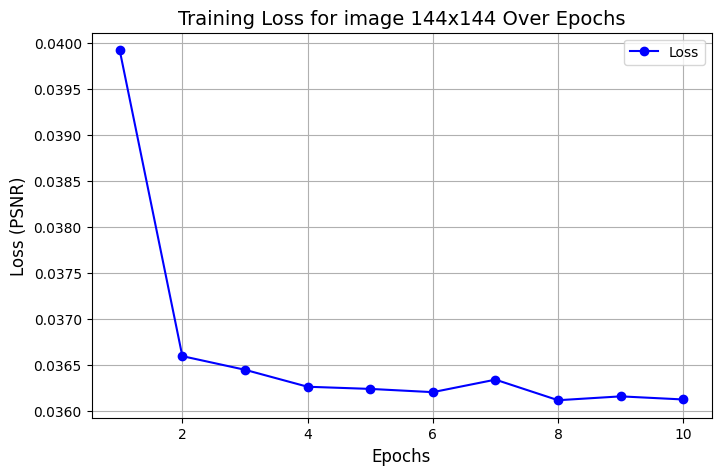

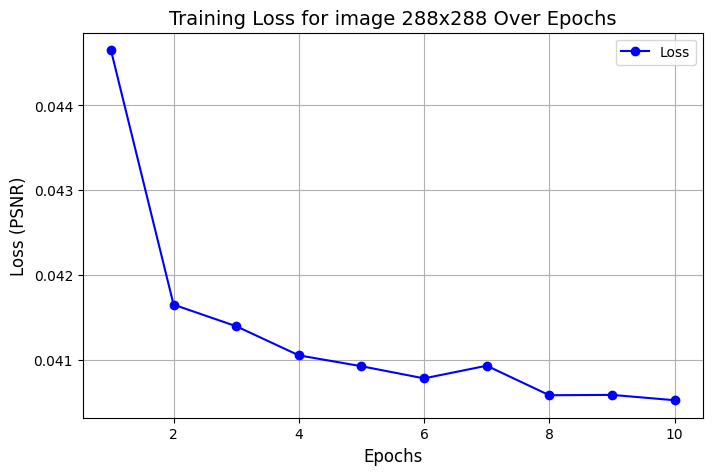

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_mid_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 144x144 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_large_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 288x288 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

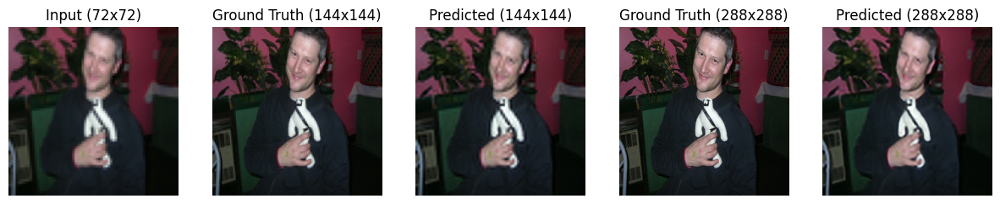

In [ ]:
model.eval()
with torch.no_grad():
    for inputs in val_loader:
        X = inputs['X'].to(device)
        y_mid = inputs['y_mid'].to(device)
        y_large = inputs['y_large'].to(device)

        out_mid, out_large = model(X)

        X = X[0].cpu().permute(1, 2, 0).numpy()
        y_mid = y_mid[0].cpu().permute(1, 2, 0).numpy()
        y_large = y_large[0].cpu().permute(1, 2, 0).numpy()
        out_mid = out_mid[0].cpu().permute(1, 2, 0).numpy()
        out_large = out_large[0].cpu().permute(1, 2, 0).numpy()

        X = np.clip(X, 0, 1)
        y_mid = np.clip(y_mid, 0, 1)
        y_large = np.clip(y_large, 0, 1)
        out_mid = np.clip(out_mid, 0, 1)
        out_large = np.clip(out_large, 0, 1)

        fig, axes = plt.subplots(1, 5, figsize=(15, 5))

        axes[0].imshow(X)
        axes[0].set_title("Input (72x72)")
        axes[0].axis("off")

        axes[1].imshow(y_mid)
        axes[1].set_title("Ground Truth (144x144)")
        axes[1].axis("off")

        axes[2].imshow(out_mid)
        axes[2].set_title("Predicted (144x144)")
        axes[2].axis("off")

        axes[3].imshow(y_large)
        axes[3].set_title("Ground Truth (288x288)")
        axes[3].axis("off")

        axes[4].imshow(out_large)
        axes[4].set_title("Predicted (288x288)")
        axes[4].axis("off")

        plt.show()
        break


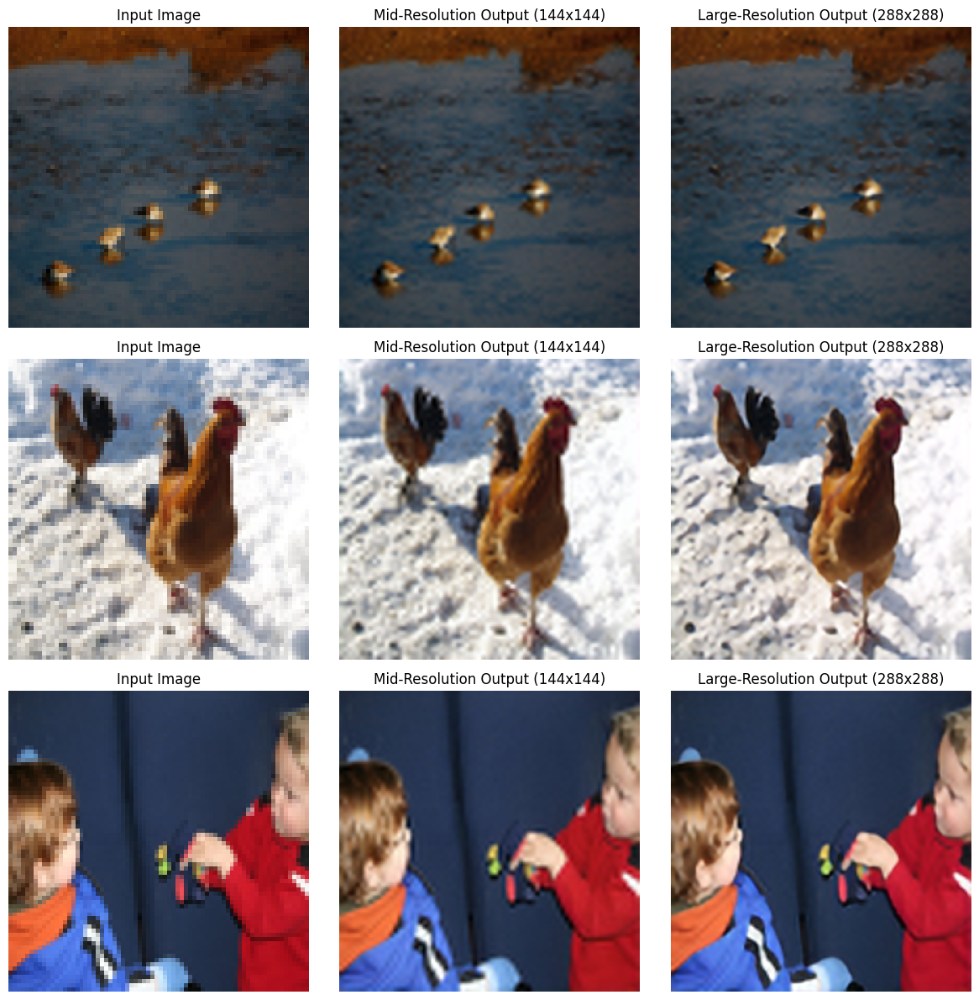

In [ ]:
# Visualization Function
def visualize_results(model, dataset, num_samples=3):
    model.eval()
    fig, axs = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

    with torch.no_grad():
        for i in range(num_samples):
            # Get the sample as a dictionary
            sample = dataset[i]
            input_img = sample['X']  # Access the low-resolution image tensor
            y_mid = sample['y_mid']
            y_large = sample['y_large']

            input_img = input_img.unsqueeze(0).to(device)

            output_mid, output_large = model(input_img)

            # Move outputs to CPU for plotting
            input_img = input_img.squeeze().permute(1, 2, 0).cpu().numpy()
            output_mid = output_mid.squeeze().permute(1, 2, 0).cpu().numpy()
            output_large = output_large.squeeze().permute(1, 2, 0).cpu().numpy()

            # Plot original input, mid, and large outputs
            axs[i, 0].imshow(input_img)
            axs[i, 0].set_title('Input Image')
            axs[i, 0].axis('off')

            axs[i, 1].imshow(output_mid)
            axs[i, 1].set_title('Mid-Resolution Output (144x144)')
            axs[i, 1].axis('off')

            axs[i, 2].imshow(output_large)
            axs[i, 2].set_title('Large-Resolution Output (288x288)')
            axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Example visualization (assuming you have a dataset like train_dataset)
visualize_results(model, train_dataset)

# Step 5

#Dilated Block

In [ ]:
class DilatedConvBlock(nn.Module):
    def __init__(self,  in_channels, out_channels):
        super(DilatedConvBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=1, padding=1)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, dilation=2, padding=2)
        self.conv3 = nn.Conv2d(out_channels, out_channels, kernel_size=3, dilation=4, padding=4)

        self.activation = nn.LeakyReLU()
        self.final_conv = nn.Conv2d(out_channels * 3, out_channels, kernel_size=3, padding=1)

    def forward(self, x):

        out1 = self.conv1(x)
        out2 = self.conv2(out1)
        out3 = self.conv3(out2)

        x_cut = torch.cat((out1, out2, out3), dim=1)

        x_out = self.final_conv(self.activation(x_cut))

        return x_out


# Fourth model

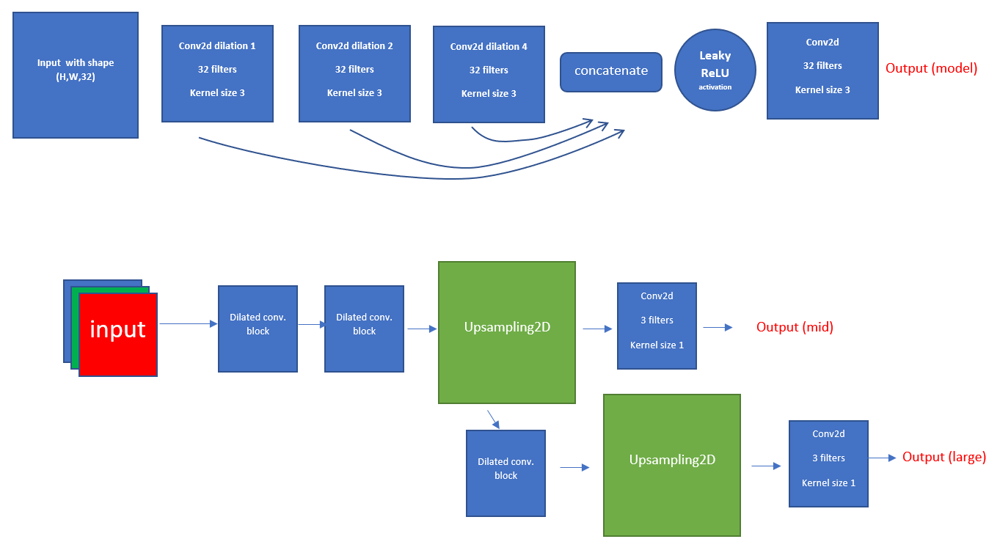

In [ ]:
class SuperResNetDilated(nn.Module):
    def __init__(self):
        super(SuperResNetDilated, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)

        self.dilated1 = DilatedConvBlock(3,32)
        self.dilated2 = DilatedConvBlock(32,32)

        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_mid = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=1)

        self.dilated3 = DilatedConvBlock(32,32)

        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_large = nn.Conv2d(in_channels=32, out_channels=3, kernel_size=1)

    def forward(self, x):
        x = self.dilated1(x)
        x = self.dilated2(x)

        x_mid = self.upsample1(x)
        out_mid = self.conv_mid(x_mid)

        x_large = self.dilated3(x_mid)

        x_large = self.upsample2(x_large)
        out_large = self.conv_large(x_large)

        return out_mid, out_large


Using device: cuda
Epoch [1/10], Mid Loss: 0.0429, Large Loss: 0.0478
Epoch [2/10], Mid Loss: 0.0376, Large Loss: 0.0426
Epoch [3/10], Mid Loss: 0.0370, Large Loss: 0.0419
Epoch [4/10], Mid Loss: 0.0369, Large Loss: 0.0417
Epoch [5/10], Mid Loss: 0.0366, Large Loss: 0.0413
Epoch [6/10], Mid Loss: 0.0366, Large Loss: 0.0414
Epoch [7/10], Mid Loss: 0.0365, Large Loss: 0.0412
Epoch [8/10], Mid Loss: 0.0365, Large Loss: 0.0411
Epoch [9/10], Mid Loss: 0.0365, Large Loss: 0.0410
Epoch [10/10], Mid Loss: 0.0363, Large Loss: 0.0408


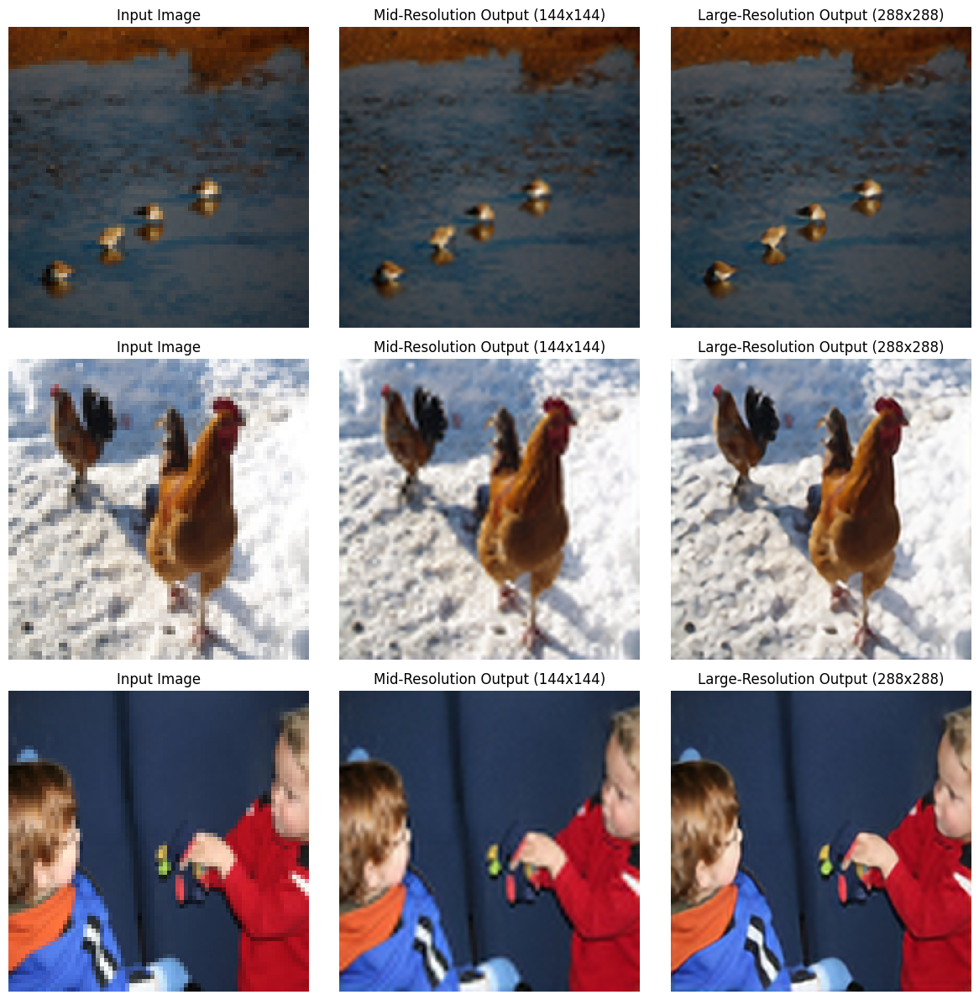

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = SuperResNetDilated().to(device)

criterion = PSNRLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_mid_history = []
loss_large_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")

# Example visualization (assuming you have a dataset like train_dataset)
visualize_results(model, train_dataset)


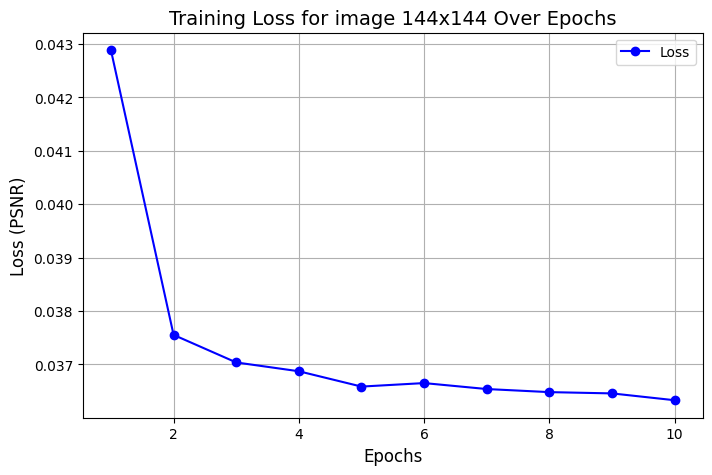

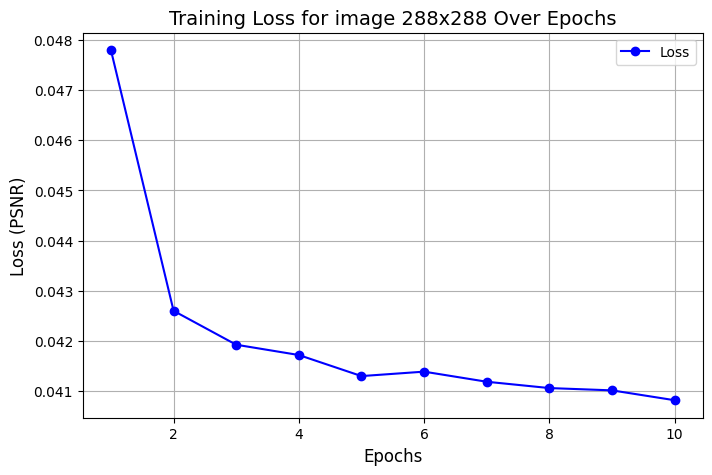

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_mid_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 144x144 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_large_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 288x288 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

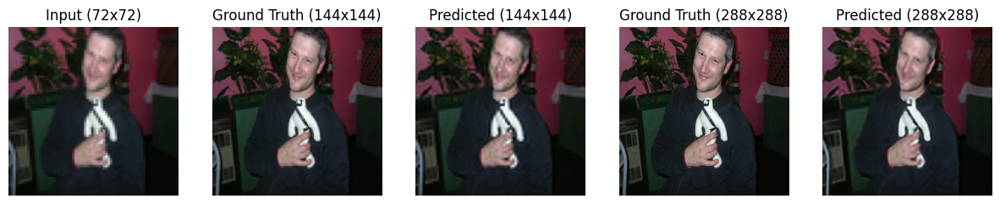

In [ ]:
model.eval()
with torch.no_grad():
    for inputs in val_loader:
        X = inputs['X'].to(device)
        y_mid = inputs['y_mid'].to(device)
        y_large = inputs['y_large'].to(device)

        out_mid, out_large = model(X)

        X = X[0].cpu().permute(1, 2, 0).numpy()
        y_mid = y_mid[0].cpu().permute(1, 2, 0).numpy()
        y_large = y_large[0].cpu().permute(1, 2, 0).numpy()
        out_mid = out_mid[0].cpu().permute(1, 2, 0).numpy()
        out_large = out_large[0].cpu().permute(1, 2, 0).numpy()

        X = np.clip(X, 0, 1)
        y_mid = np.clip(y_mid, 0, 1)
        y_large = np.clip(y_large, 0, 1)
        out_mid = np.clip(out_mid, 0, 1)
        out_large = np.clip(out_large, 0, 1)

        fig, axes = plt.subplots(1, 5, figsize=(15, 5))

        axes[0].imshow(X)
        axes[0].set_title("Input (72x72)")
        axes[0].axis("off")

        axes[1].imshow(y_mid)
        axes[1].set_title("Ground Truth (144x144)")
        axes[1].axis("off")

        axes[2].imshow(out_mid)
        axes[2].set_title("Predicted (144x144)")
        axes[2].axis("off")

        axes[3].imshow(y_large)
        axes[3].set_title("Ground Truth (288x288)")
        axes[3].axis("off")

        axes[4].imshow(out_large)
        axes[4].set_title("Predicted (288x288)")
        axes[4].axis("off")

        plt.show()
        break


# Step 6

# Fifth model

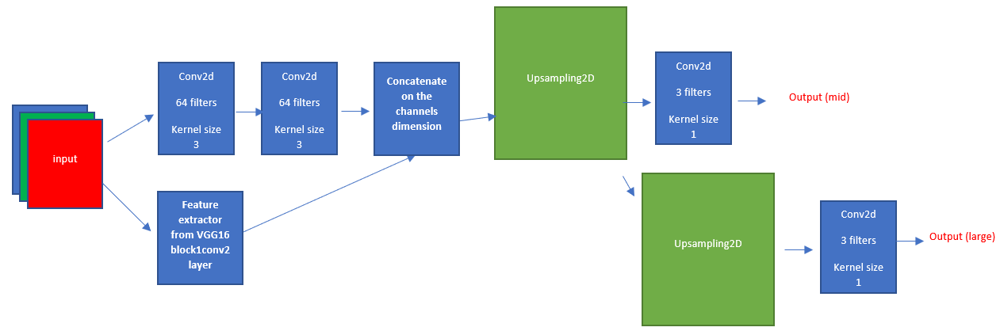

In [ ]:
class FeatureExtractor(nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()

        vgg16 = models.vgg16(pretrained=True)

        self.feature_extractor = nn.Sequential(*list(vgg16.features.children())[:4])

        for param in self.feature_extractor.parameters():
            param.requires_grad = False

    def forward(self, x):
        return self.feature_extractor(x)


class SuperResNetWithVGG(nn.Module):
    def __init__(self):
        super(SuperResNetWithVGG, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)

        self.feature_extractor = FeatureExtractor()

        self.conv_merge = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1)


        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_mid = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_large = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

    def forward(self, x):
        x_main = self.conv1(x)
        x_main = self.conv2(x_main)

        x_vgg = self.feature_extractor(x)

        x_combined = torch.cat([x_main, x_vgg], dim=1)
        x_combined = self.conv_merge(x_combined)

        x_mid = self.upsample1(x_combined)
        out_mid = self.conv_mid(x_mid)

        x_large = self.upsample2(x_mid)
        out_large = self.conv_large(x_large)

        return out_mid, out_large


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = SuperResNetWithVGG().to(device)

criterion = PSNRLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_mid_history = []
loss_large_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")


Using device: cuda
Epoch [1/10], Mid Loss: 0.0401, Large Loss: 0.0438
Epoch [2/10], Mid Loss: 0.0373, Large Loss: 0.0420
Epoch [3/10], Mid Loss: 0.0369, Large Loss: 0.0418
Epoch [4/10], Mid Loss: 0.0366, Large Loss: 0.0416
Epoch [5/10], Mid Loss: 0.0365, Large Loss: 0.0416
Epoch [6/10], Mid Loss: 0.0364, Large Loss: 0.0415
Epoch [7/10], Mid Loss: 0.0363, Large Loss: 0.0415
Epoch [8/10], Mid Loss: 0.0365, Large Loss: 0.0416
Epoch [9/10], Mid Loss: 0.0363, Large Loss: 0.0414
Epoch [10/10], Mid Loss: 0.0363, Large Loss: 0.0415


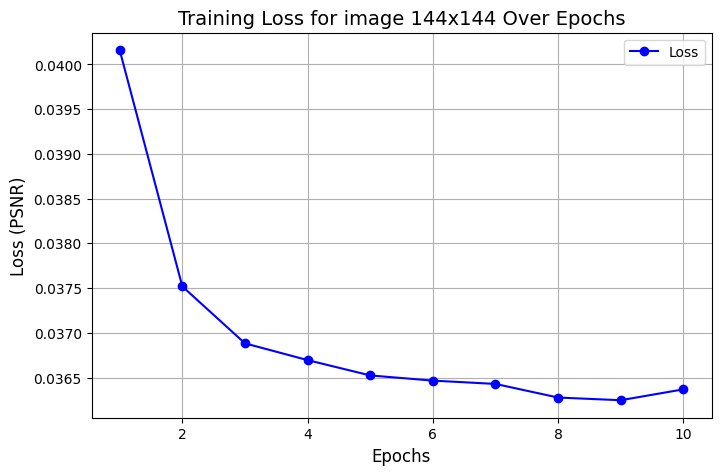

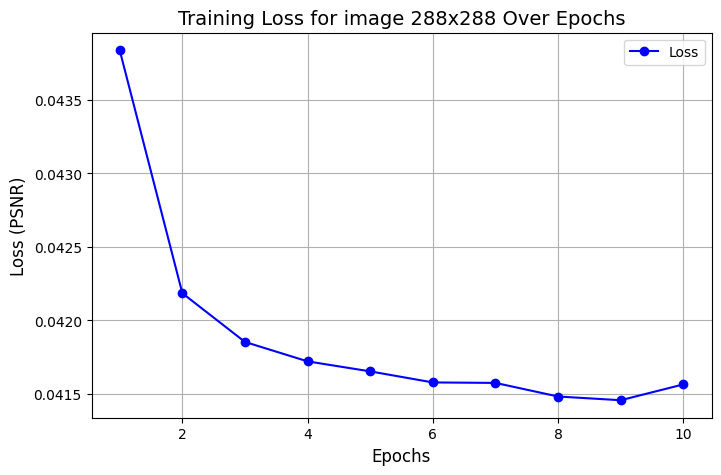

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_mid_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 144x144 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(range(1, num_epochs + 1), loss_large_history, marker='o', linestyle='-', color='b', label="Loss")
plt.xlabel("Epochs", fontsize=12)
plt.ylabel("Loss (PSNR)", fontsize=12)
plt.title("Training Loss for image 288x288 Over Epochs", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

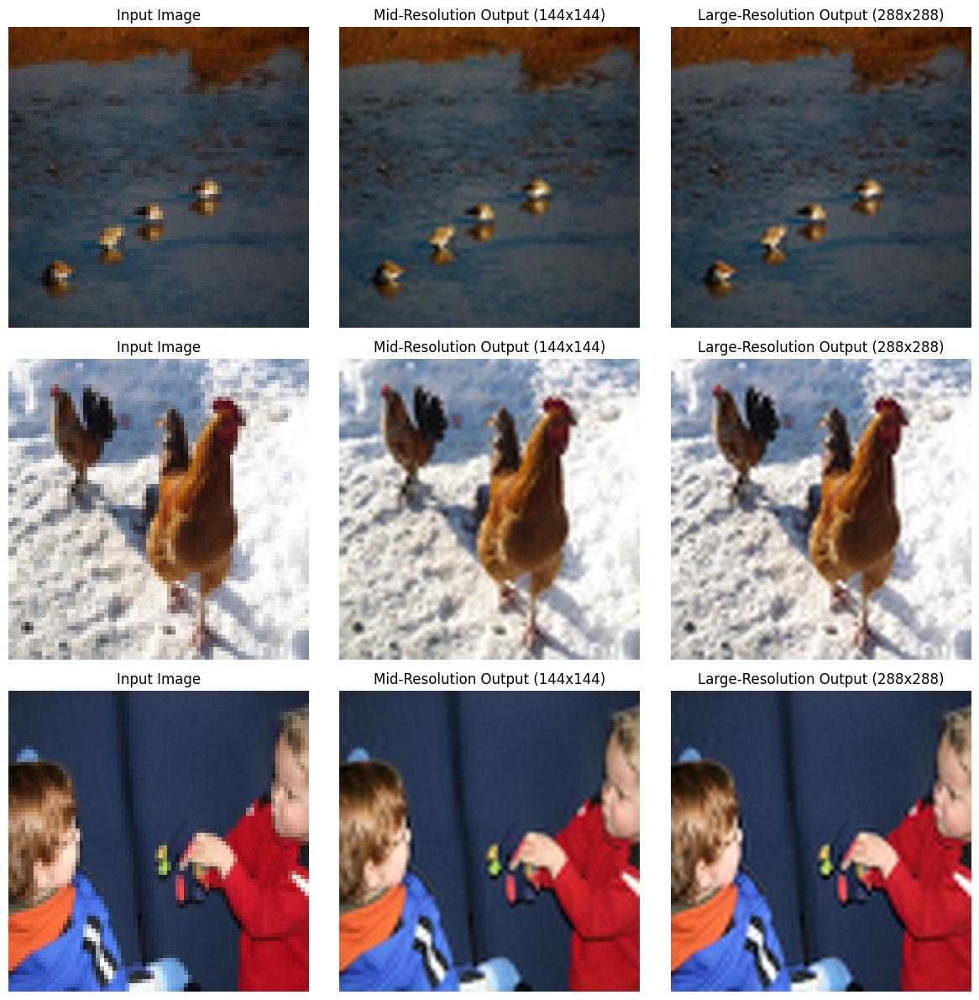

In [ ]:
visualize_results(model, train_dataset)

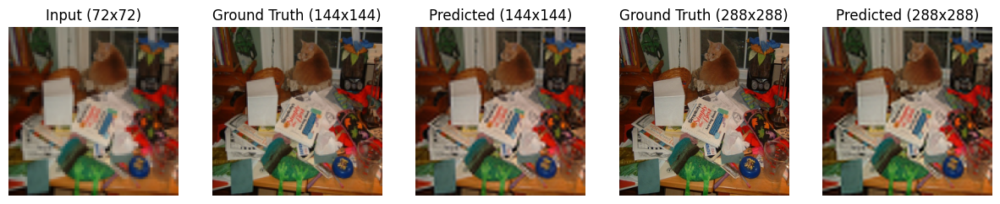

In [ ]:
model.eval()
with torch.no_grad():
    for batch in val_loader:
        X = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        out_mid, out_large = model(X)

        X = X[0].cpu().permute(1, 2, 0).numpy()
        y_mid = y_mid[0].cpu().permute(1, 2, 0).numpy()
        y_large = y_large[0].cpu().permute(1, 2, 0).numpy()
        out_mid = out_mid[0].cpu().permute(1, 2, 0).numpy()
        out_large = out_large[0].cpu().permute(1, 2, 0).numpy()

        X = np.clip(X, 0, 1)
        y_mid = np.clip(y_mid, 0, 1)
        y_large = np.clip(y_large, 0, 1)
        out_mid = np.clip(out_mid, 0, 1)
        out_large = np.clip(out_large, 0, 1)

        fig, axes = plt.subplots(1, 5, figsize=(15, 5))

        axes[0].imshow(X)
        axes[0].set_title("Input (72x72)")
        axes[0].axis("off")

        axes[1].imshow(y_mid)
        axes[1].set_title("Ground Truth (144x144)")
        axes[1].axis("off")

        axes[2].imshow(out_mid)
        axes[2].set_title("Predicted (144x144)")
        axes[2].axis("off")

        axes[3].imshow(y_large)
        axes[3].set_title("Ground Truth (288x288)")
        axes[3].axis("off")

        axes[4].imshow(out_large)
        axes[4].set_title("Predicted (288x288)")
        axes[4].axis("off")

        plt.show()
        break


# Step 7

In [ ]:
val_batch = next(iter(val_loader))
sample_input = val_batch['X'][0].unsqueeze(0).to(device)
sample_target_mid = val_batch['y_mid'][0].unsqueeze(0).to(device)
sample_target_large = val_batch['y_large'][0].unsqueeze(0).to(device)


In [ ]:
save_dir_mid = "training_progress/mid_resolution"
save_dir_large = "training_progress/large_resolution"
os.makedirs(save_dir_mid, exist_ok=True)
os.makedirs(save_dir_large, exist_ok=True)
loss_mid_history = []
loss_large_history = []

num_epochs = 30
save_every = 1
for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")

    if (epoch + 1) % save_every == 0:
        model.eval()
        with torch.no_grad():
            pred_mid, pred_large = model(sample_input)

        pred_mid = pred_mid[0].cpu().permute(1, 2, 0).numpy()
        pred_large = pred_large[0].cpu().permute(1, 2, 0).numpy()
        sample_target_mid_np = sample_target_mid[0].cpu().permute(1, 2, 0).numpy()
        sample_target_large_np = sample_target_large[0].cpu().permute(1, 2, 0).numpy()

        pred_mid = np.clip(pred_mid, 0, 1)
        pred_large = np.clip(pred_large, 0, 1)
        sample_target_mid_np = np.clip(sample_target_mid_np, 0, 1)
        sample_target_large_np = np.clip(sample_target_large_np, 0, 1)

        fig, ax = plt.subplots(1, 2, figsize=(8, 4))
        ax[0].imshow(sample_target_mid_np)
        ax[0].set_title("Ground Truth (144x144)")
        ax[0].axis("off")
        ax[1].imshow(pred_mid)
        ax[1].set_title(f"Predicted (Epoch {epoch + 1})")
        ax[1].axis("off")
        plt.savefig(f"{save_dir_mid}/epoch_{epoch + 1}.png")
        plt.close()


        fig, ax = plt.subplots(1, 2, figsize=(8, 4))
        ax[0].imshow(sample_target_large_np)
        ax[0].set_title("Ground Truth (288x288)")
        ax[0].axis("off")
        ax[1].imshow(pred_large)
        ax[1].set_title(f"Predicted (Epoch {epoch + 1})")
        ax[1].axis("off")
        plt.savefig(f"{save_dir_large}/epoch_{epoch + 1}.png")
        plt.close()

Epoch [1/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [2/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [3/30], Mid Loss: 0.0366, Large Loss: 0.0417
Epoch [4/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [5/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [6/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [7/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [8/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [9/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [10/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [11/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [12/30], Mid Loss: 0.0363, Large Loss: 0.0415
Epoch [13/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [14/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [15/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [16/30], Mid Loss: 0.0361, Large Loss: 0.0414
Epoch [17/30], Mid Loss: 0.0362, Large Loss: 0.0414
Epoch [18/30], Mid Loss: 0.0361, Large Loss: 0.0413
Epoch [19/30], Mid Loss: 0.0362, Large Loss: 0.0415
Epoch [20/30], Mid Lo

In [ ]:
save_dirs = {
    "Mid Resolution": "training_progress1/mid_resolution",
    "Large Resolution": "training_progress1/large_resolution"
}

for save_dir in save_dirs.values():
    os.makedirs(save_dir, exist_ok=True)

for epoch in range(num_epochs):
    model.eval()
    with torch.no_grad():
        pred_mid, pred_large = model(sample_input)

    pred_mid_np = pred_mid[0].cpu().permute(1, 2, 0).numpy()
    pred_large_np = pred_large[0].cpu().permute(1, 2, 0).numpy()

    pred_mid_np = np.clip(pred_mid_np, 0, 1)
    pred_large_np = np.clip(pred_large_np, 0, 1)

    plt.imsave(f"{save_dirs['Mid Resolution']}/epoch_{epoch + 1}.png", pred_mid_np)
    plt.imsave(f"{save_dirs['Large Resolution']}/epoch_{epoch + 1}.png", pred_large_np)



📌 **Mid Resolution - Training Progress**
▶️ **Creating GIF for Mid Resolution**...

🎥 **GIF - Mid Resolution:**


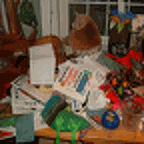

🖼️ **Creating Collage for Mid Resolution - Predicted Image Evolution Over Epochs**...


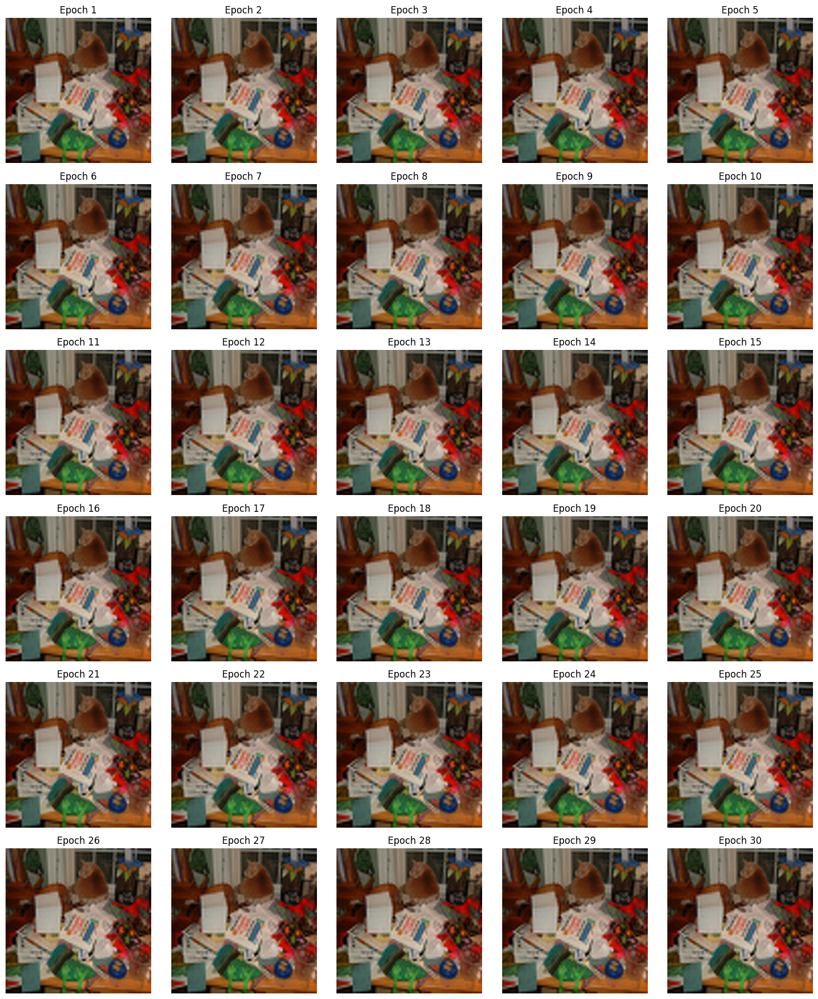


📌 **Large Resolution - Training Progress**
▶️ **Creating GIF for Large Resolution**...

🎥 **GIF - Large Resolution:**


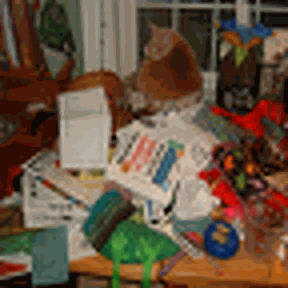

🖼️ **Creating Collage for Large Resolution - Predicted Image Evolution Over Epochs**...


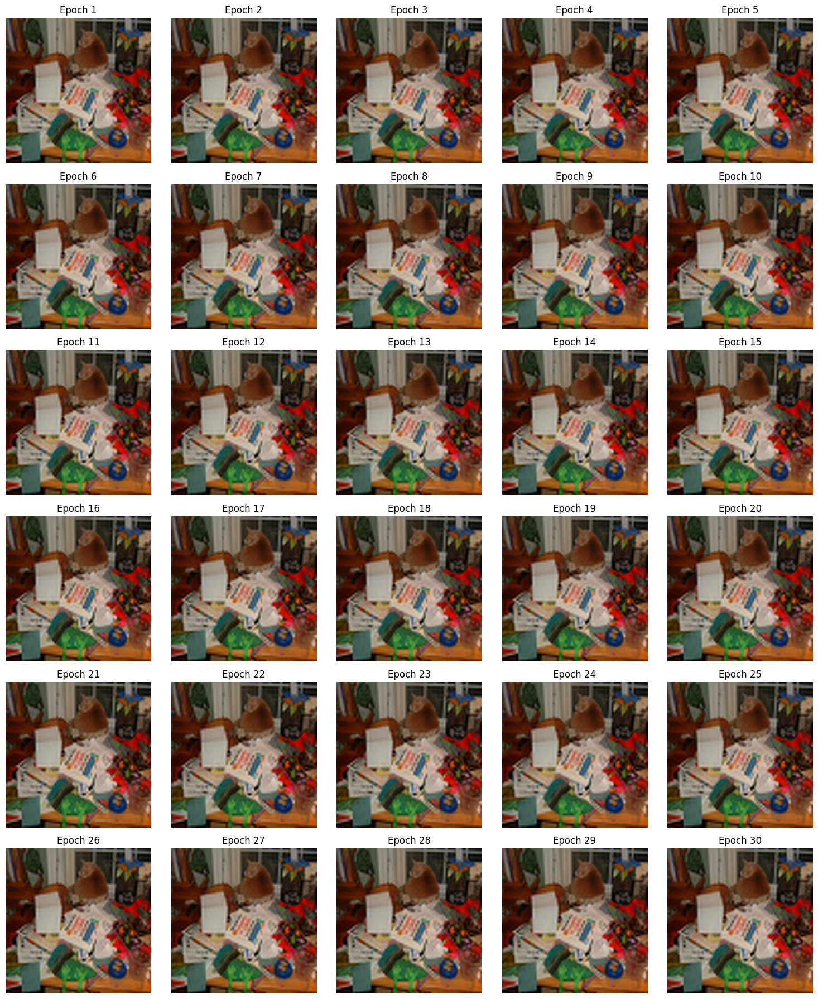

In [ ]:
save_dirs = {
    "Mid Resolution": "training_progress1/mid_resolution",
    "Large Resolution": "training_progress1/large_resolution"
}

for key, save_dir in save_dirs.items():
    print(f"\n📌 **{key} - Training Progress**")

    gif_path = os.path.join(save_dir, f"training_progress_{key.replace(' ', '_').lower()}.gif")

    if not os.path.exists(save_dir):
        print(f"⚠ The directory '{save_dir}' does not exist. Skipping...")
        continue

    image_files = sorted(
        [f for f in os.listdir(save_dir) if f.startswith("epoch_") and f.endswith(".png")],
        key=lambda x: int(x.split("_")[1].split(".")[0])
    )

    if not image_files:
        print(f"⚠ No matching epoch images found in {save_dir}. Skipping...")
        continue

    images = [Image.open(os.path.join(save_dir, file)) for file in image_files]

    print(f"▶️ **Creating GIF for {key}**...")
    imageio.mimsave(gif_path, [np.array(img) for img in images], duration=0.1)

    print(f"\n🎥 **GIF - {key}:**")
    display(IPImage(filename=gif_path))

    print(f"🖼️ **Creating Collage for {key} - Predicted Image Evolution Over Epochs**...")

    num_epochs = len(images)
    cols = 5
    rows = int(np.ceil(num_epochs / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 3))

    for i, ax in enumerate(axes.flatten()):
        if i < num_epochs:
            ax.imshow(images[i])
            epoch_number = image_files[i].split("_")[1].split(".")[0]
            ax.set_title(f"Epoch {epoch_number}", fontsize=12)
            ax.axis("off")
        else:
            ax.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
print("Training progress directory exists:", os.path.exists("training_progress"))
print("Files in directory:", os.listdir("training_progress") if os.path.exists("training_progress") else "Directory not found")


Training progress directory exists: True
Files in directory: ['epoch_17.png', 'epoch_5.png', 'epoch_6.png', 'epoch_14.png', 'epoch_13.png', 'epoch_19.png', 'epoch_8.png', 'epoch_15.png', 'epoch_10.png', 'epoch_1.png', 'epoch_3.png', 'epoch_4.png', 'epoch_18.png', 'epoch_11.png', 'epoch_20.png', 'training_progress.gif', 'epoch_7.png', 'epoch_12.png', 'epoch_2.png', 'epoch_16.png', 'epoch_9.png']


# Bonus

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_clip, preprocess = clip.load("ViT-B/32", device=device)

class CLIPFeatureExtractor(nn.Module):
    def __init__(self):
        super(CLIPFeatureExtractor, self).__init__()
        self.model = model_clip

    def forward(self, x):
        x = torch.stack([preprocess(transforms.ToPILImage()(img.mul(255).byte())) for img in x])
        x = x.to(device)
        with torch.no_grad():
            features = self.model.encode_image(x)
        return features

class SuperResNetWithCLIP(nn.Module):
    def __init__(self):
        super(SuperResNetWithCLIP, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1)

        self.feature_extractor = CLIPFeatureExtractor()

        self.conv_merge = nn.Conv2d(in_channels=576, out_channels=64, kernel_size=3, padding=1)  # 64 + 512 מערוצי CLIP

        # Upsampling layers
        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_mid = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.conv_large = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=1)

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x_main = self.relu(self.conv1(x))
        x_main = self.relu(self.conv2(x_main))

        x_clip = self.feature_extractor(x)

        x_clip = x_clip.unsqueeze(-1).unsqueeze(-1)
        x_clip = x_clip.expand(-1, -1, x_main.shape[2], x_main.shape[3])

        x_combined = torch.cat((x_main, x_clip), dim=1)
        x_combined = self.relu(self.conv_merge(x_combined))

        x_mid = self.upsample1(x_combined)
        out_mid = self.conv_mid(x_mid)

        x_large = self.upsample2(x_mid)
        out_large = self.conv_large(x_large)

        return out_mid, out_large


In [ ]:
model = SuperResNetWithCLIP().to(device)

criterion = PSNRLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
loss_mid_history = []
loss_large_history = []

for epoch in range(num_epochs):
    model.train()
    running_loss_mid = 0.0
    running_loss_large = 0.0

    for batch in train_loader:
        inputs = batch['X'].to(device)
        y_mid = batch['y_mid'].to(device)
        y_large = batch['y_large'].to(device)

        optimizer.zero_grad()

        # Forward pass
        output_mid, output_large = model(inputs)

        # Calculate losses
        loss_mid = criterion(output_mid, y_mid)
        loss_large = criterion(output_large, y_large)

        # Total loss (balanced equally)
        total_loss = loss_mid + loss_large

        # Backward pass and optimization
        total_loss.backward()
        optimizer.step()

        running_loss_mid += loss_mid.item()
        running_loss_large += loss_large.item()
    avg_loss_mid = running_loss_mid / len(train_loader)
    avg_loss_large = running_loss_large / len(train_loader)
    loss_mid_history.append(avg_loss_mid)
    loss_large_history.append(avg_loss_large)
    print(f"Epoch [{epoch+1}/{num_epochs}], Mid Loss: {avg_loss_mid :.4f}, Large Loss: {avg_loss_large:.4f}")


Epoch [1/10], Mid Loss: 0.0473, Large Loss: 0.0507
Epoch [2/10], Mid Loss: 0.0402, Large Loss: 0.0445
Epoch [3/10], Mid Loss: 0.0392, Large Loss: 0.0437
Epoch [4/10], Mid Loss: 0.0387, Large Loss: 0.0432
Epoch [5/10], Mid Loss: 0.0385, Large Loss: 0.0431
Epoch [6/10], Mid Loss: 0.0381, Large Loss: 0.0428
Epoch [7/10], Mid Loss: 0.0381, Large Loss: 0.0428
Epoch [8/10], Mid Loss: 0.0380, Large Loss: 0.0427
Epoch [9/10], Mid Loss: 0.0377, Large Loss: 0.0425
Epoch [10/10], Mid Loss: 0.0377, Large Loss: 0.0425


We will select 10 sample images from our set and create manual captions that describe them.

In [ ]:
image_path =['/content/VOCdevkit/VOC2007/JPEGImages/000619.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/007964.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/007931.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/003703.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/006234.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/007781.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/005590.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/003466.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/001557.jpg',
 '/content/VOCdevkit/VOC2007/JPEGImages/000832.jpg']

In [ ]:
descriptions = [
    "Bird on the grass",
    "Race car in competition",
    "A collector's car from the 1970s",
    "Open-air competition car",
    "Cat lying on the sand",
    "Flowers in a planter",
    "DThe three cats are looking out the window.",
    "A person celebrates a birthday",
    "Open-air competition car",
    "Talkie in a cage"

]


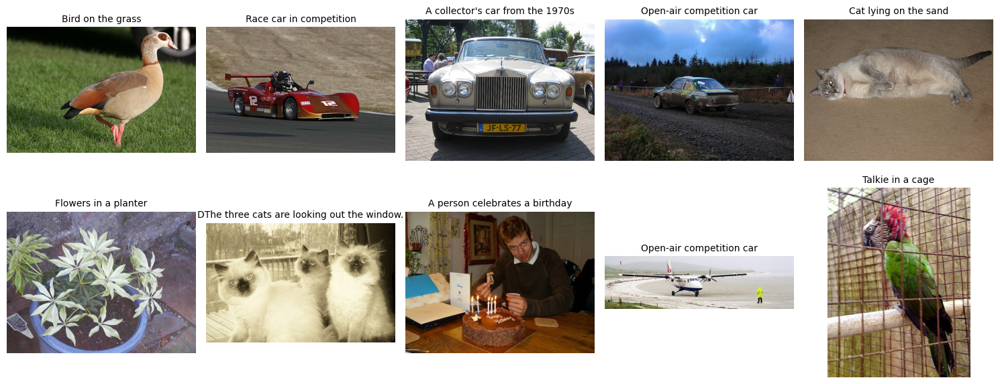

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, ax in enumerate(axes.flatten()):
    if i < len(image_path):
        img = Image.open(image_path[i])
        ax.imshow(img)
        ax.set_title(descriptions[i], fontsize=10)
        ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model_clip, preprocess = clip.load("ViT-B/32", device=device)

image_tensors = [preprocess(Image.open(img)).unsqueeze(0).to(device) for img in image_path]
image_features = torch.cat([model_clip.encode_image(img) for img in image_tensors])

text_tokens = clip.tokenize(descriptions).to(device)
text_features = model_clip.encode_text(text_tokens)

cosine_sim = torch.nn.functional.cosine_similarity(image_features.unsqueeze(1), text_features.unsqueeze(0), dim=2)
cosine_matrix = cosine_sim.cpu().detach().numpy()


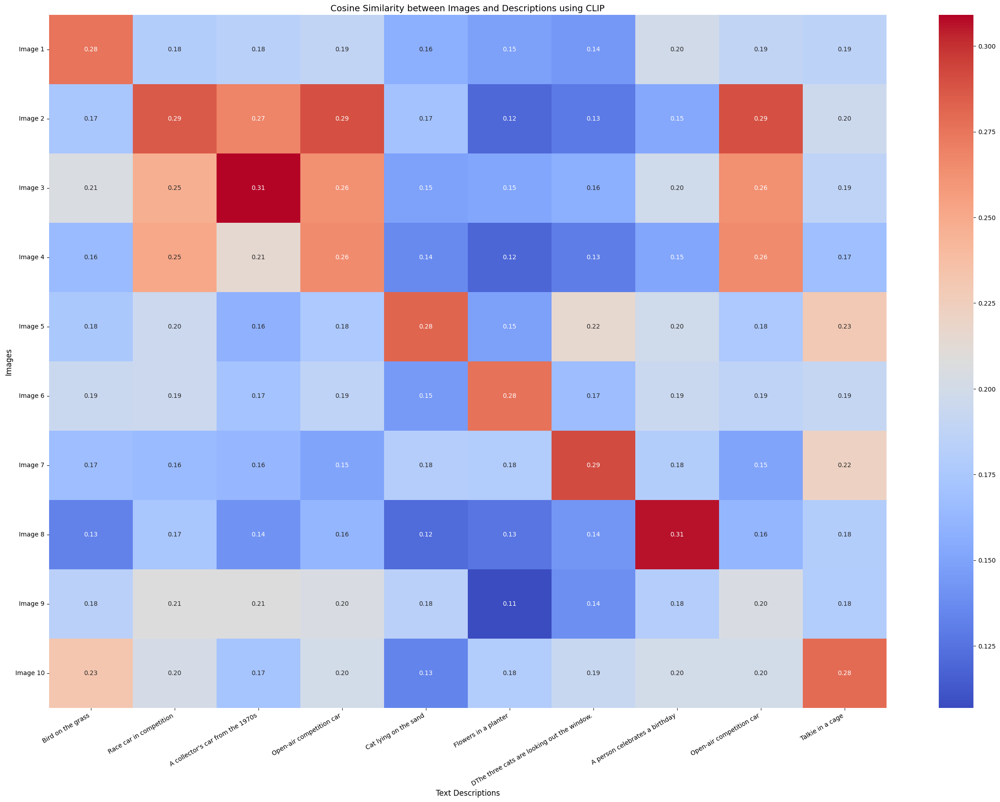

In [ ]:
plt.figure(figsize=(30, 20))
ax = sns.heatmap(cosine_matrix, annot=True, cmap="coolwarm", fmt=".2f",
                 xticklabels=descriptions, yticklabels=[f"Image {i+1}" for i in range(len(image_path))])

plt.xticks(rotation=30, ha="right", fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.xlabel("Text Descriptions", fontsize=12)
plt.ylabel("Images", fontsize=12)
plt.title("Cosine Similarity between Images and Descriptions using CLIP", fontsize=14)
plt.show()
